# 安裝環境與載入工具

In [14]:
# 1. 安裝與載入 YOLO 工具
!pip install ultralytics
!pip install roboflow

import os
from roboflow import Roboflow
from ultralytics import YOLO

# 從Roboflow下載最新資料集

In [17]:
from roboflow import Roboflow
rf = Roboflow(api_key="bMXxofQaZyuViTHm5Gh6")
project = rf.workspace("ring-lildt").project("ring3")
version = project.version(5)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


In [18]:
# 下載完後，建議補上這行，讓後面的程式碼自動抓路徑
import os
data_path = os.path.join(dataset.location, "data.yaml")
print(f"資料集已下載至：{data_path}")

資料集已下載至：/content/ring3-5/data.yaml


# Model training (v5)

In [19]:
from ultralytics import YOLO

# 1. 載入預訓練權重 (Pre-trained weights)
# 我們使用 yolo11n.pt，這是一個兼顧速度與準確度的輕量化模型
model = YOLO("yolo11n.pt")

# 2. 開始訓練
print("🚀 啟動 YOLOv11 訓練流程...")
results = model.train(
    data=data_path,      # 剛剛下載資料集時自動產生的路徑
    epochs=50,           # 訓練輪數。因為你照片增加了，建議設為 50 輪讓它學更深
    imgsz=640,           # 影像輸入尺寸，640 是 YOLO 的標準規格
    device="cpu",        # 如果你沒有開啟 GPU 權限，請設為 "cpu"；如果有 GPU 則會自動偵測
    plots=True,          # 訓練結束後會自動繪製準確度曲線圖
    name="ring_detection_v5" # 給這次實驗取個名字，方便找檔案
)

print("✅ 訓練結束！請查看下方的數據表格。")

🚀 啟動 YOLOv11 訓練流程...
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/ring3-5/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=ring_detection_v5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=T

In [20]:
# 想要問Colab拿到了幾張圖
import os

# 1. 定義資料集路徑 (請根據你下載後的資料夾名稱修改，通常是 'ring3-5' 或 'ring3-6')
# 如果你不確定資料夾名稱，可以看左邊的小資料夾圖示
dataset_path = '/content/ring3-5'

if os.path.exists(dataset_path):
    print(f"--- 資料集統計：{dataset_path} ---")

    # 定義要檢查的子目錄
    sub_dirs = ['train', 'valid', 'test']
    total_images = 0

    for sub in sub_dirs:
        img_dir = os.path.join(dataset_path, sub, 'images')
        if os.path.exists(img_dir):
            count = len([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])
            print(f"📍 {sub} (分組) 的圖片數量: {count}")
            total_images += count
        else:
            print(f"⚠️ 找不到 {sub} 資料夾下的 images 目錄")

    print("-" * 30)
    print(f"🔥 總計拿到的圖片張數: {total_images}")
else:
    print(f"❌ 找不到路徑: {dataset_path}，請檢查左側資料夾名稱是否正確。")

--- 資料集統計：/content/ring3-5 ---
📍 train (分組) 的圖片數量: 81
📍 valid (分組) 的圖片數量: 8
📍 test (分組) 的圖片數量: 4
------------------------------
🔥 總計拿到的圖片張數: 93


# 測試

請上傳一張線蟲照片進行測試：


Saving 1-8.jpg to 1-8.jpg

image 1/1 /content/1-8.jpg: 384x640 1 rings, 137.9ms
Speed: 6.2ms preprocess, 137.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)


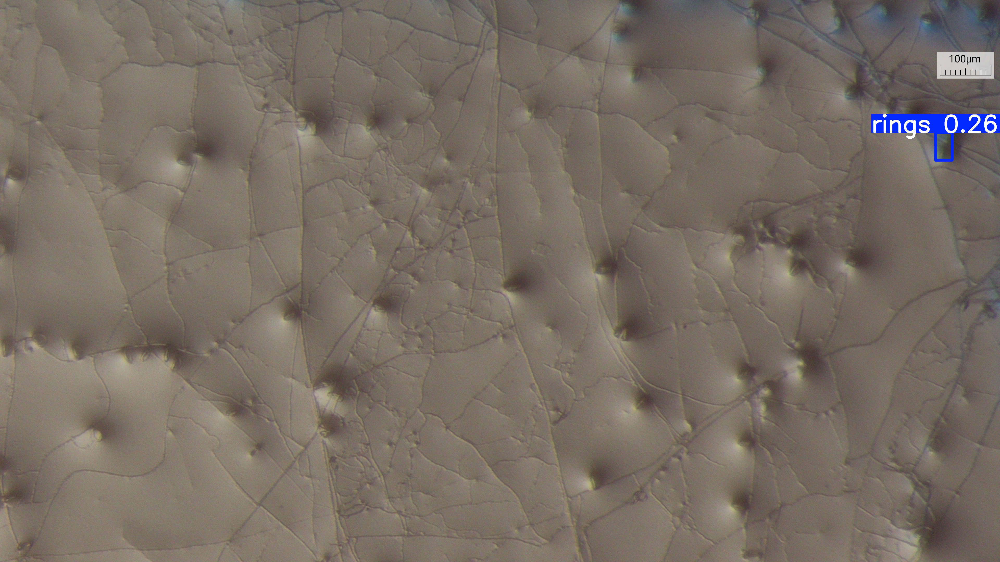

🔍 在這張照片中，AI 總共偵測到 1 個捕捉環。


In [21]:
from ultralytics import YOLO
from google.colab import files
from google.colab.patches import cv2_imshow
import cv2

# 1. 載入你剛剛確認過的那顆「最強大腦」
# 請確保路徑中的資料夾名稱 (例如 ring_detection_v5) 是正確的
model_path = '/content/runs/detect/ring_detection_v5/weights/best.pt'
model = YOLO(model_path)

# 2. 上傳測試照片
print("請上傳一張線蟲照片進行測試：")
uploaded = files.upload()

for filename in uploaded.keys():
    # 3. 執行辨識 (conf 建議設在 0.25 左右，太低會有很多亂框，太高會抓不到)
    results = model.predict(source=filename, conf=0.25, imgsz=640)

    # 4. 顯示結果
    res_plotted = results[0].plot()
    cv2_imshow(res_plotted)

    # 5. 印出抓到幾個捕捉環
    print(f"🔍 在這張照片中，AI 總共偵測到 {len(results[0].boxes)} 個捕捉環。")

In [22]:
# 執行驗證模式
metrics = model.val()

print(f"🏆 整體平均精確度 (mAP50): {metrics.box.map50:.3f}")
print(f"🎯 精準率 (Precision): {metrics.box.mp:.3f}")
print(f"🎣 召回率 (Recall): {metrics.box.mr:.3f}")

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1294.5±565.5 MB/s, size: 384.7 KB)
val: Scanning /content/ring3-5/valid/labels.cache... 8 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 8/8 2.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4s/it 1.4s
                   all          8        485      0.424      0.381      0.363      0.154
Speed: 1.1ms preprocess, 122.5ms inference, 0.0ms loss, 25.4ms postprocess per image
Results saved to /content/runs/detect/val
🏆 整體平均精確度 (mAP50): 0.363
🎯 精準率 (Precision): 0.424
🎣 召回率 (Recall): 0.381
